# 4.0 Evaluando modelos de texto generativos

Tras este módulo, he optado por modificar el tokenizer y el corpus, ya que la respuesta del entrenamiento no estaba siendo consistente produciéndose diversas incoherencias en la gestión de los tokens.

### 4.0.1 Limpieza del Dataset (El crimen y el castigo)

In [110]:
import re

with open('Datasets/El crimen y el castigo.txt', 'r', encoding='utf-8-sig') as f:
    text = f.read()

#Unión de palabras cortadas por saltos de línea (antes de limpiar saltos)
text = re.sub(r'(?<=[^\n])\n(?=[^\n])', ' ', text)

#Eliminación de los guiones bajos (las cursivas del original)
text = re.sub(r'_', '', text)

#Normalización de espacios y saltos de línea
text = re.sub(r' +', ' ', text)          #Quitar espacios dobles
text = re.sub(r'\n{3,}', '\n\n', text)   #Máximo dos saltos de línea
text = text.strip()                      #Quitar espacios al inicio y final

with open('Datasets/Corpus_CLEAN.txt', 'w', encoding='utf-8') as f:
    f.write(text)

print("¡Limpieza completada!")

¡Limpieza completada!


### 4.0.2 Entrenamiento de nuestro tokenizer con el corpus limpio

Este es el código que utilicé para entrenar el tokenizer de nuestro modelo.

In [111]:
import os
from tokenizers import ByteLevelBPETokenizer

#Ruta de la carpeta para guardar el tokenizer
output_dir = "Tokenizer_Dostoyevski"

#Crea la carpeta si no existe
os.makedirs(output_dir, exist_ok=True)

tokenizer = ByteLevelBPETokenizer()

tokenizer.train(
    files=["./Datasets/Corpus_CLEAN.txt"],
    vocab_size=12000,  #Vocabulario sano y reducido para evitar sílabas rotas
    min_frequency=2,
    special_tokens=["<|endoftext|>"]
)

tokenizer.save_model(output_dir)

print(f"Tokenizador entrenado y guardado en '{output_dir}/tokenizer.json'")

Tokenizador entrenado y guardado en 'Tokenizer_Dostoyevski/tokenizer.json'


Vamos a cargar el tokenizer con el que se entrenó al modelo que pondremos a prueba posteriormente, debido a que si se utilizara algún otro, por muy similar que fuera, los pesos se establecen sobre los ides del vocabulario y no serviría de nada tener un modelo entrenado.

In [140]:
import os
from tokenizers import ByteLevelBPETokenizer

#Rutas de los archivos de configuración
vocab_path = "Tokenizer_GPT2_12000/bpe_tokenizer_compacto-vocab.json"
merges_path = "Tokenizer_GPT2_12000/bpe_tokenizer_compacto-merges.txt"

try:
    tokenizer = ByteLevelBPETokenizer(vocab_path, merges_path)
    print("¡Tokenizador cargado correctamente y listo para usar!")

except FileNotFoundError as e:
    print("ERROR: No se pudieron encontrar los archivos del tokenizador.")
    
    #Validamos si es porque la carpeta ni siquiera existe
    if not os.path.exists("Tokenizer_GPT2_12000"):
        print("Motivo: La carpeta 'Tokenizer_GPT2_12000' no existe.")
    else:
        print(f"Motivo: Falta uno de los archivos requeridos en la carpeta.\n   Detalle del sistema: {e}")

except Exception as e:
    #Captura cualquier otro error inesperado (problemas de permisos, archivo corrupto, etc.)
    print(f"Ocurrió un error inesperado al cargar el tokenizador: {e}")

¡Tokenizador cargado correctamente y listo para usar!


In [141]:
import torch
def text_to_token_ids(text,tokenizer):
    encoded = tokenizer.encode(text)
    encoded_tensor = torch.tensor(encoded.ids).unsqueeze(0) #Añado dimensión de batch
    return encoded_tensor

In [142]:
start_context = "La puerta se cierra"
token_ids = text_to_token_ids(start_context, tokenizer)
token_ids

tensor([[1017,  710,  296, 9583]])

In [143]:
def token_ids_to_text(token_ids, tokenizer):
    # .squeeze(0) elimina la dimensión de batch para que sea una lista plana
    flat_ids = token_ids.squeeze(0).tolist()
    return tokenizer.decode(flat_ids)

In [144]:
token_ids_to_text(token_ids,tokenizer)

'La puerta se cierra'

In [145]:
tamano_vocab = tokenizer.get_vocab_size()
print(f"El tamaño del vocabulario es: {tamano_vocab}")

El tamaño del vocabulario es: 12000


## 4.1 Generación de texto

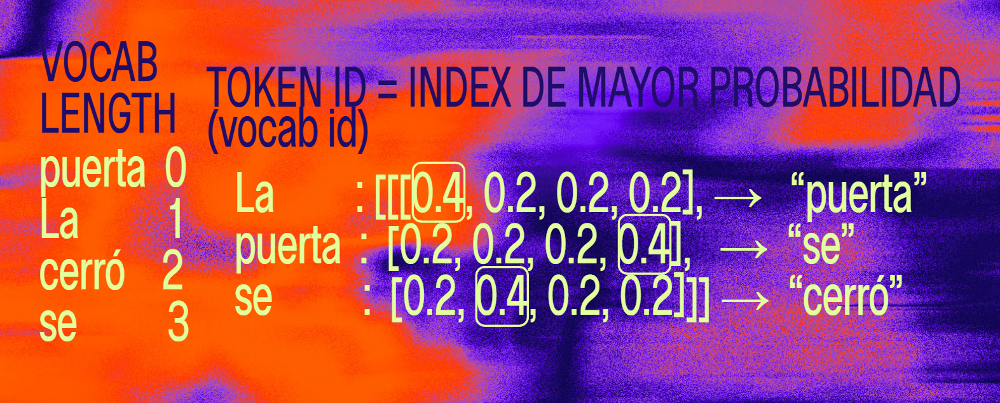

In [146]:
from importlib.metadata import version

pkgs = [
    "matplotlib",
    "numpy",
    "tiktoken",
    "torch",
    "tensorflow"
]

for p in pkgs:
    print(f"{p} version: {version(p)}")

matplotlib version: 3.10.9
numpy version: 2.4.4
tiktoken version: 0.12.0
torch version: 2.4.1
tensorflow version: 2.21.0


In [147]:
import torch
from clases_a_utilizar import GPTModel
cfg = {
    "vocab_size": tamano_vocab,    # Vocabulary size
    "context_length": 256, # Context length
    "emb_dim": 384,         # Embedding dimension
    "n_heads": 6,          # Number of attention heads (para la atención multi-cabezal enmascarada)
    "n_layers": 6,         # Number of layers (iteraciones en el bloque transformador)
    "drop_rate": 0.3,       # Dropout rate
    "qkv_bias": False       # Query-Key-Value bias
}

In [148]:
torch.manual_seed(123)
model = GPTModel(cfg)
#Este modo eval() desactiva el dropout a la hora de generar texto ya que necesitamos el modelo a su máximo rendimiento
model.eval();

In [149]:
from clases_a_utilizar import generate_text_simple

start_context = "Tengo una idea"

token_ids = generate_text_simple(
    model=model,
    idx=text_to_token_ids(start_context, tokenizer),
    max_new_tokens=10,
    context_size=cfg["context_length"]
)

In [150]:
token_ids

tensor([[ 4310,   346,  1127,  5681, 10719, 10108,  7679,  2920,  6075,  9525,
          5794,  8190,  2014]])

In [151]:
token_ids_to_text(token_ids,tokenizer)

'Tengo una idea deno Zakharovitch vaciloofr repentRodión rusa verosímil inquietar Amalia'

## 4.2 Calculando el error del texto generado: Entropía cruzada y perplejidad

In [152]:
inputs = torch.tensor([[1017,710,296], #La puerta se
                       [4310,346,1127]]) #Tengo una idea

targets = torch.tensor([[710,296,9583], # puerta se cierra
                       [346,1127,5681]]) # una idea brillante

In [153]:
with torch.no_grad():
    logits = model(inputs)

In [154]:
logits.shape

torch.Size([2, 3, 12000])

In [155]:
probas = torch.softmax(logits, dim=-1)
probas.shape

torch.Size([2, 3, 12000])

In [156]:
probas

tensor([[[4.1702e-05, 5.1602e-05, 5.5812e-05,  ..., 5.2704e-05,
          5.0329e-05, 1.0283e-04],
         [2.0703e-05, 6.2824e-05, 3.7981e-05,  ..., 8.9553e-05,
          5.4882e-05, 9.4726e-05],
         [3.3677e-05, 4.4495e-05, 1.1436e-04,  ..., 1.1022e-04,
          2.9215e-05, 2.4861e-05]],

        [[8.3248e-05, 1.2091e-04, 6.5680e-05,  ..., 4.5177e-05,
          7.5465e-05, 6.9637e-05],
         [3.4860e-05, 6.8620e-05, 3.2070e-05,  ..., 1.0952e-04,
          6.8104e-05, 1.2867e-04],
         [1.1406e-04, 3.7798e-05, 7.9732e-05,  ..., 6.8157e-05,
          4.0974e-05, 4.7341e-05]]])

In [157]:
token_ids = torch.argmax(probas, dim=-1, keepdim=True)
print("Token IDs:\n", token_ids)

Token IDs:
 tensor([[[ 4948],
         [ 1654],
         [11251]],

        [[ 4818],
         [ 2147],
         [ 5681]]])


In [158]:
print("Targets batch 1:",token_ids_to_text(targets[0],tokenizer))
print("Output batch 1:",token_ids_to_text(token_ids[0].flatten(),tokenizer))


Targets batch 1:  puerta se cierra
Output batch 1: tatelado orejas


In [159]:
#Extraigo las probabilidades de los índices de mayor probabilidad para cada palabra
text_idx = 0
target_probas_1 = probas[text_idx, [0, 1, 2], targets[text_idx]]
print("Texto 1:", target_probas_1)

Texto 1: tensor([8.9540e-05, 5.6716e-05, 8.0517e-05])


In [160]:
text_idx = 1
target_probas_2 = probas[text_idx, [0, 1, 2], targets[text_idx]]
print("Texto 2:", target_probas_2)

Texto 2: tensor([2.5475e-05, 1.1181e-04, 8.0548e-04])


In [161]:
#Computa el logaritmo de todas las probabilidades de tokens para obtener una estabilidad numérica y hacer más simple la optimizacióm
log_probas = torch.log(torch.cat((target_probas_1,target_probas_2)))
print(log_probas)

tensor([ -9.3208,  -9.7775,  -9.4270, -10.5778,  -9.0987,  -7.1241])


In [162]:
-1*torch.mean(log_probas)

tensor(9.2210)

Durante el entrenamiento nuestro objetivo es llevar este número lo más cerca a 0 posible. Lo que significará que la probabilidad estará cerca de 1 en los índices predichos, puesto que logaritmo de 1 es 0.

Si cualquiera de estos fuera 1 o estuviera cerca, nos diría que el modelo tiene cierta seguridad en que el índice con esa probabilidad es el token_id que debe relacionar.

### Hasta ahora hemos visto como funciona la entropía cruzada por dentro, pero para agilizar el trabajo pytorch encapsula esta función en un método más eficiente.

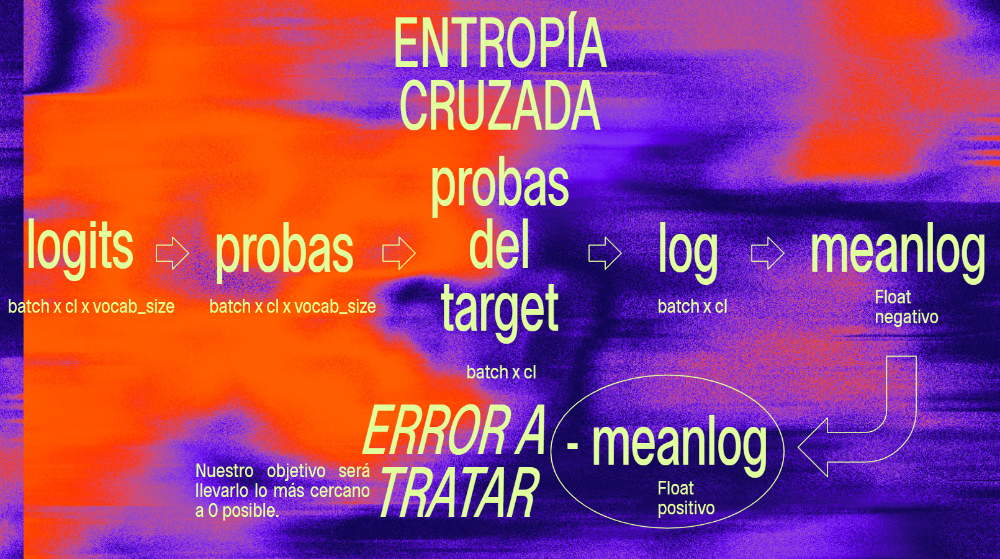

Para que esta función de pytorch funcione debemos pasarle los logits y las targets en 2 dimensiones.

In [163]:
logits.shape

torch.Size([2, 3, 12000])

In [164]:
logits_flat = logits.flatten(0,1)
logits_flat.shape

torch.Size([6, 12000])

In [165]:
targets.shape

torch.Size([2, 3])

In [166]:
targets_flat = targets.flatten()
targets_flat.shape

torch.Size([6])

In [167]:
torch.nn.functional.cross_entropy(logits_flat,targets_flat)

tensor(9.2210)

Como podemos ver nos ha dado lo mismo que nos dió anteriormente.

## 4.3 Calculando los conjuntos de entrenamiento y validación

In [168]:
with open('Datasets/Corpus_CLEAN.txt', 'r', encoding='utf-8') as f:
    text_data = f.read()  

In [169]:
text_data[0:1002]

'Una tarde muy calurosa de principios de julio, salió del cuartito que ocupaba, junto al techo de una gran casa de cinco pisos, un joven, que, lentamente y con aire irresoluto, se dirigió hacia el puente de K***.\n\nTuvo suerte, al bajar la escalera, de no encontrarse a su patrona que habitaba en el piso cuarto, y cuya cocina, que tenía la puerta constantemente sin cerrar, daba a la escalera. Cuando salía el joven, había de pasar forzosamente bajo el fuego del enemigo, y cada vez que esto ocurría experimentaba aquél una molesta sensación de temor que, humillándole, le hacía fruncir el entrecejo. Tenía una deuda no pequeña con su patrona y le daba vergüenza el encontrarla.\n\nNo quiere esto decir que la desgracia le intimidase o abatiese; nada de eso; pero la verdad era que, desde hacía algún tiempo, se hallaba en cierto estado de irritación nerviosa, rayano con la hipocondría. A fuerza de aislarse y de encerrarse en sí mismo, acabó por huir, no solamente de su patrona, sino de toda rel

In [170]:
total_characters = len(text_data)
total_tokens = len(tokenizer.encode(text_data).ids)

print("Carácteres totales:",total_characters)
print("Tokens totales:",total_tokens)

Carácteres totales: 1050597
Tokens totales: 236777


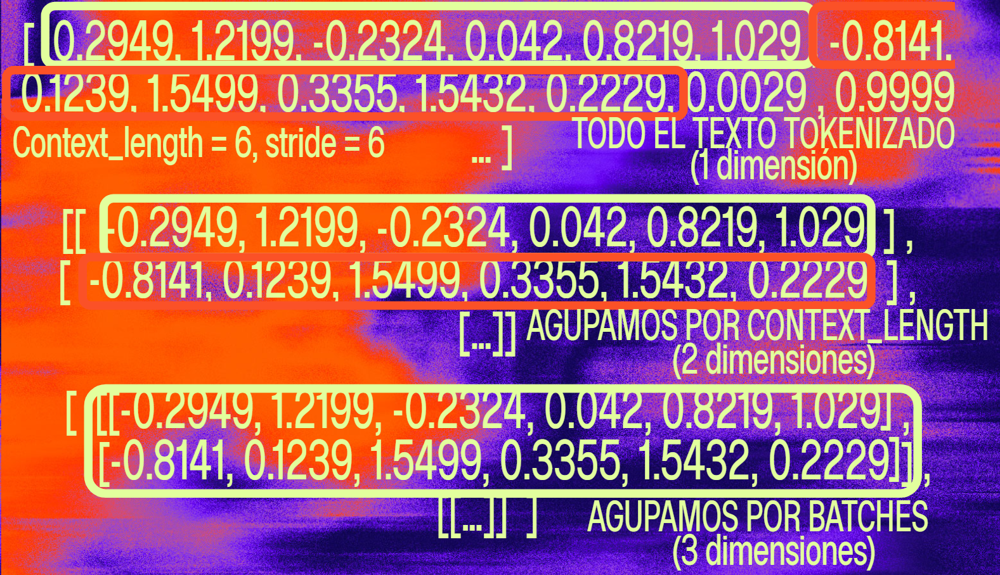

In [171]:
from clases_a_utilizar import crea_dataloader_v1

#Utilizaremos el 90% del texto para entrenar y 10% para validar
train_ratio = 0.90
split_idx = int(train_ratio * len(text_data))
train_data = text_data[:split_idx]
val_data = text_data[split_idx:]
print(f"Número de caracteres de entrenamiento: {int(train_ratio * len(text_data))}\nNúmero de caracteres para validación: {len(text_data)-int(train_ratio * len(text_data))}")

Número de caracteres de entrenamiento: 945537
Número de caracteres para validación: 105060


In [172]:
train_loader = crea_dataloader_v1(
    train_data,
    tokenizer=tokenizer,
    batch_size=8, 
    max_length=cfg["context_length"], 
    stride=cfg["context_length"]//2, 
    drop_last=True, 
    shuffle=True,
    num_workers=0
)
val_loader = crea_dataloader_v1(
    val_data, 
    tokenizer=tokenizer,
    batch_size=8, 
    max_length=cfg["context_length"], 
    stride=cfg["context_length"]//2, 
    drop_last=False, 
    shuffle=False,
    num_workers=0
)

In [173]:
print("Train loader:")
for x, y in train_loader:
    pass
print(x.shape, y.shape)

Train loader:
torch.Size([8, 256]) torch.Size([8, 256])


In [174]:
print("Val loader:")
for x, y in val_loader:
    pass
print(x.shape, y.shape)

Val loader:
torch.Size([6, 256]) torch.Size([6, 256])


In [175]:
#Qué hace numel
print("Batch shape:",x.shape)
print("Número de elementos en el batch:",x.numel())

Batch shape: torch.Size([6, 256])
Número de elementos en el batch: 1536


In [176]:
train_tokens = 0
for input_batch, target_batch in train_loader:
    train_tokens += input_batch.numel()
    
val_tokens = 0
for input_batch, target_batch in val_loader:
    val_tokens += input_batch.numel()

print("Tokens de entrenamiento:",train_tokens)
print("Tokens de validación:",val_tokens)
print("Todos los tokens:",val_tokens+train_tokens)

Tokens de entrenamiento: 425984
Tokens de validación: 46592
Todos los tokens: 472576


In [177]:
total_tokens

236777

Hay el doble de tokens que los totales debido a que el stride es la mitad que el context_length.

In [178]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [179]:
def calc_loss_batch(input_batch, target_batch, model, device):
    input_batch, target_batch = input_batch.to(device), target_batch.to(device)
    logits = model(input_batch)
    loss = torch.nn.functional.cross_entropy(logits.flatten(0, 1), target_batch.flatten())
    return loss

#Si ponemos num_batches = 2 se computará el error para 2 batches en vez de para cada uno y así el cómputo será más fácil
def calc_loss_loader(data_loader, model, device, num_batches=None):
    #Inicializamos el loss total para cada batch de num_batches
    model.to(device)
    total_loss = 0.
    if len(data_loader) == 0:
        return float("nan")
    elif num_batches is None:
        #Si no establecemos el loss por batches coge todos los del dataloader y computa el error sobre todos ellos
        num_batches = len(data_loader)
    else:
        #Reduce el número de batches para igualar al número total de batches del dataloader si num_batches es mayor
        num_batches = min(num_batches, len(data_loader))
        
    for i, (input_batch, target_batch) in enumerate(data_loader):
        if i < num_batches:
            loss = calc_loss_batch(input_batch, target_batch, model, device)
            total_loss += loss.item()
        else:
            break
    return total_loss / num_batches

In [76]:
torch.manual_seed(123)

with torch.no_grad():
    train_loss = calc_loss_loader(train_loader,model,device)
    val_loss = calc_loss_loader(val_loader,model,device)

print("Error de entrenamiento:",train_loss)
print("Error de validación:",train_loss)

Error de entrenamiento: 10.341062683262596
Error de validación: 10.341062683262596


In [77]:
#  PERPLEJIDAD
#Nos dice entre qué valores está inseguro (aproximadamente) el modelo, ej: posibilidades de palabras, posiciones de las mismas...
torch.exp(torch.tensor([10.3578]))

tensor([31501.7871])

## 4.4 Entrenamiento del LLM

In [180]:
def train_model_simple(model, train_loader, val_loader, optimizer, device, num_epocas,
                       eval_freq, eval_iter):

    train_losses, val_losses, track_tokens_seen = [], [], []
    tokens_seen, global_step = 0, -1

    #Loop principal de entrenamiento
    for epoca in range(num_epocas):
        model.train() 

        for input_batch, target_batch in train_loader:
            optimizer.zero_grad() #Reseteo de gradientes para que no se contaminen unos a otros
            loss = calc_loss_batch(input_batch, target_batch, model, device)
            loss.backward() # Calculamos gradientes con Backpropagation
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step() #Actualizamos los pesos con la función de optimización en función de sus gradientes
            tokens_seen += input_batch.numel()
            global_step += 1

            #Evaluación opcional
            if global_step % eval_freq == 0:
                train_loss, val_loss = evaluate_model(
                    model, train_loader, val_loader, device, eval_iter)
                train_losses.append(train_loss)
                val_losses.append(val_loss)
                track_tokens_seen.append(tokens_seen)
                print(f"Ep {epoca+1} (Step {global_step:06d}): "
                      f"Train loss {train_loss:.3f}, Val loss {val_loss:.3f}")

        scheduler.step()
    return train_losses, val_losses, track_tokens_seen


def evaluate_model(model, train_loader, val_loader, device, eval_iter):
    model.eval()
    with torch.no_grad():
        train_loss = calc_loss_loader(train_loader, model, device, num_batches=eval_iter)
        val_loss = calc_loss_loader(val_loader, model, device, num_batches=eval_iter)
    model.train()
    return train_loss, val_loss


# MÁS ADELANTE SE EXPLICA -----------------
def generate_text(model,idx,max_new_tokens,context_size, temperature=0.0, top_k=None, eos_id=None):
    for _ in range(max_new_tokens):
        idx_cond = idx[:,-context_size:]

        with torch.no_grad():
            logits = model(idx_cond)
        logits = logits[:, -1, :]

        if top_k is not None:
            top_logits, top_pos = torch.topk(logits,top_k)
            new_logits = torch.where(
                condition = logits < top_logits[:, [-1]],
                input = torch.tensor(float("-inf")),
                other = logits
            )

        if temperature > 0.0:
            logits = logits / temperature
            probs = torch.softmax(logits, dim=-1)
            idx_next = torch.multinomial(probs,num_samples=1)

        else:
            idx_next = torch.argmax(logits, dim=-1, keepdim=True)

        if idx_next == eos_id:
            break
        idx = torch.cat((idx, idx_next), dim=1)
    return idx
#---------------------------

In [181]:
device

device(type='cpu')

In [50]:
torch.manual_seed(123)
model = GPTModel(cfg)
model.to(device)
optimizer = torch.optim.AdamW(model.parameters(),lr=0.0001,weight_decay=0.15)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=35,      #Numero de épocas max a entrenar
    eta_min=1e-6   #LR mínimo al que bajará al final
)

In [51]:
epocas = 35
train_losses, val_losses, token_seen = train_model_simple(
    model, train_loader, val_loader, optimizer, device,
    num_epocas=epocas, eval_freq=100, eval_iter=5
)

Ep 1 (Step 000000): Train loss 9.907, Val loss 9.903
Ep 1 (Step 000100): Train loss 6.690, Val loss 6.696
Ep 1 (Step 000200): Train loss 6.205, Val loss 6.360
Ep 1 (Step 000300): Train loss 5.907, Val loss 6.162
Ep 1 (Step 000400): Train loss 5.795, Val loss 6.048
Mire usted, y D. Como lo puedo, fue los entera para que estaba lasustavito, como una de Santa Cruz un rincón. A ama. El único, que era como ni de sus deseaba los ajumao a sea, y que componían, y disimulo más para
Ep 2 (Step 000500): Train loss 5.841, Val loss 5.961
Ep 2 (Step 000600): Train loss 5.693, Val loss 5.915
Ep 2 (Step 000700): Train loss 5.607, Val loss 5.865
Ep 2 (Step 000800): Train loss 5.494, Val loss 5.816
Mire usted, que mira de vestirse, y interro, que se me decidir, después. --dijo otra hacía la nariz... Que estás.   --decía... Yo no me ro a mí quién, nunca, dejando Maxi-- Sea--Yo no sé
Ep 3 (Step 000900): Train loss 5.565, Val loss 5.789
Ep 3 (Step 001000): Train loss 5.568, Val loss 5.773
Ep 3 (Step 001100

KeyboardInterrupt: 

In [52]:
#torch.save(model.state_dict(), "/Modelos/gal-2_modelo5_12000.pth")

## 4.5 Estrategias de decodificación para controlar la aleatoriedad

In [100]:
import torch
from clases_a_utilizar import GPTModel

ruta_modelo = "Modelos/gal-2_modelo5_12000.pth"

device = torch.device("cpu")

model = GPTModel(cfg)
model.to(device)

weights = torch.load(ruta_modelo, map_location=device, weights_only=True)
model.load_state_dict(weights)

model.to(torch.float32)
model.eval()

print("Modelo GPT cargado correctamente a la CPU.")

Modelo GPT cargado correctamente a la CPU.


### 4.5.1 Escalado de temperatura

In [51]:
vocab = {
    "amor": 0,
    "la": 1,
    "El": 2,
    "fuerza": 3,
    "es": 4,
    "mundo": 5,
    "del": 6,
    "mayor": 7,
}

inverse_vocab = {v: k for k, v in vocab.items()}
inverse_vocab

{0: 'amor',
 1: 'la',
 2: 'El',
 3: 'fuerza',
 4: 'es',
 5: 'mundo',
 6: 'del',
 7: 'mayor'}

In [52]:
#model(x)
next_token_logits = torch.randn(8)
next_token_logits

tensor([-0.2344,  1.2811, -1.0779,  1.2829,  1.1543,  0.0313,  1.5209, -0.5070])

In [53]:
probas = torch.softmax(next_token_logits, dim=0)
probas

tensor([0.0446, 0.2032, 0.0192, 0.2035, 0.1790, 0.0582, 0.2582, 0.0340])

In [54]:
next_token_id = torch.argmax(probas).item()
next_token_id

6

In [55]:
inverse_vocab[next_token_id]

'del'

In [56]:
#torch.manual_seed(123)
#En vez de poner siempre el de mayor probabilidad establece su propia probabilidad para salir como next_token
#Sobre todo saldrá 'del' de id=6 ya que tiene un 26,61% de probabilidades de que salga
next_token_id = torch.multinomial(probas,num_samples=1).item()
print(inverse_vocab[next_token_id])

del


In [57]:
def softmax_with_temperature(logits,temperature):
    scaled_logits = logits / temperature
    return torch.softmax(scaled_logits, dim=0)

In [58]:
temperatures = [1, 0.1, 5]
#1 no escalará, 0.1 hará más grande los logits y 5 hará más pequeños los logits
#Si modificamos al alza o a la baja los logits con las temperaturas también modificaremos la salida del softmax
#Cuanto mayor son los logits (menor temperatura) mayor es el desbalance entre probabilidades y
#y cuanto menor son los logits (mayor temperatura) menor es el desbalance entre las probabilidades

In [59]:
scaled_probas = [softmax_with_temperature(next_token_logits,T) for T in temperatures]

In [60]:
probas

tensor([0.0446, 0.2032, 0.0192, 0.2035, 0.1790, 0.0582, 0.2582, 0.0340])

In [61]:
scaled_probas[1] #Temperatura de 0.1

tensor([1.9687e-08, 7.5141e-02, 4.2767e-12, 7.6557e-02, 2.1159e-02, 2.8061e-07,
        8.2714e-01, 1.2900e-09])

In [62]:
scaled_probas[2] #Temperatura de 5

tensor([0.1076, 0.1457, 0.0909, 0.1457, 0.1420, 0.1134, 0.1528, 0.1019])

### 4.5.2 Top-k Sampling

Consiste en distribuir la probabilidad en los k valores de probabilidad más alta estableciendo n-k a -infinito para que la función softmax les asigne 0.00.

In [63]:
next_token_logits = torch.randn(8)
next_token_logits

tensor([ 0.3833, -0.8075, -0.5744, -1.8061,  0.6862,  1.2823, -0.5088, -0.6135])

In [64]:
top_k = 3
top_logits, top_pos = torch.topk(next_token_logits,top_k)
print(top_logits,top_pos)

tensor([1.2823, 0.6862, 0.3833]) tensor([5, 4, 0])


In [65]:
#top_logits[-1] es el más pequeño de los top_k
new_logits = torch.where(
    condition = next_token_logits < top_logits[-1],
    input = torch.tensor(float("-inf")),
    other = next_token_logits
)

In [66]:
new_logits

tensor([0.3833,   -inf,   -inf,   -inf, 0.6862, 1.2823,   -inf,   -inf])

In [67]:
torch.softmax(new_logits,dim=-1)

tensor([0.2079, 0.0000, 0.0000, 0.0000, 0.2814, 0.5108, 0.0000, 0.0000])

### 4.5.3 Modificando la función de generación de texto

In [107]:
tokenizer.get_vocab_size()

12000

In [108]:
tokenizer.decode([0])

'<|endoftext|>'

In [104]:
def generate_text(model,idx,max_new_tokens,context_size, temperature=0.0, top_k=None, eos_id=None):
    for _ in range(max_new_tokens):
        idx_cond = idx[:,-context_size:]

        with torch.no_grad():
            logits = model(idx_cond)
        logits = logits[:, -1, :]

        if top_k is not None:
            top_logits, top_pos = torch.topk(logits,top_k)
            new_logits = torch.where(
                condition = logits < top_logits[:, -1],
                input = torch.tensor(float("-inf")),
                other = logits
            )

        if temperature > 0.0:
            logits = logits / temperature
            probs = torch.softmax(logits, dim=-1)
            idx_next = torch.multinomial(probs,num_samples=1)

        else:
            idx_next = torch.argmax(logits, dim=-1, keepdim=True)

        if idx_next == eos_id:
            break
        idx = torch.cat((idx, idx_next), dim=1)
    return idx

In [124]:
token_ids = generate_text(
    model=model,
    idx=text_to_token_ids("El",tokenizer),
    max_new_tokens=30,
    context_size=cfg["context_length"],
    top_k=30,
    temperature=0.6
)
print("Salida:\n\n",token_ids_to_text(token_ids,tokenizer))

Salida:

 El joven.

--¡Oh, Sonia! ¡No es!

--¡Qué quiere decir usted más que no se lo traiga; pero no es


In [125]:
token_ids = generate_text(
    model=model,
    idx=text_to_token_ids("El",tokenizer).to(device),
    max_new_tokens=30,
    context_size=cfg["context_length"],
    top_k=30,
    temperature=0.8
)
print("Salida:\n\n",token_ids_to_text(token_ids,tokenizer))

Salida:

 El joven no hubiera tomado más que el gabán de mis hijos. Más tarde, me he tocado su hermana, y esto no haría el mundo se llevó a


## 4.6 Utilidad: AUTOCOMPLETAR

### 4.6.1 Cargar tokenizer y modelo ya entrenados

In [1]:
import os
from tokenizers import ByteLevelBPETokenizer

#Rutas de los archivos de configuración
vocab_path = "Tokenizer_GPT2_12000/bpe_tokenizer_compacto-vocab.json"
merges_path = "Tokenizer_GPT2_12000/bpe_tokenizer_compacto-merges.txt"

try:
    tokenizer = ByteLevelBPETokenizer(vocab_path, merges_path)
    print("¡Tokenizador cargado correctamente y listo para usar!")

except FileNotFoundError as e:
    print("ERROR: No se pudieron encontrar los archivos del tokenizador.")
    
    #Validamos si es porque la carpeta ni siquiera existe
    if not os.path.exists("Tokenizer_GPT2_12000"):
        print("Motivo: La carpeta 'Tokenizer_GPT2_12000' no existe.")
    else:
        print(f"Motivo: Falta uno de los archivos requeridos en la carpeta.\n   Detalle del sistema: {e}")

except Exception as e:
    #Captura cualquier otro error inesperado (problemas de permisos, archivo corrupto, etc.)
    print(f"Ocurrió un error inesperado al cargar el tokenizador: {e}")

¡Tokenizador cargado correctamente y listo para usar!


In [2]:
import torch

def text_to_token_ids(text,tokenizer):
    encoded = tokenizer.encode(text)
    encoded_tensor = torch.tensor(encoded.ids).unsqueeze(0) #Añado dimensión de batch
    return encoded_tensor

def token_ids_to_text(token_ids, tokenizer):
    # .squeeze(0) elimina la dimensión de batch para que sea una lista plana
    flat_ids = token_ids.squeeze(0).tolist()
    return tokenizer.decode(flat_ids)

In [3]:
tamano_vocab = tokenizer.get_vocab_size()
print(f"El tamaño del vocabulario es: {tamano_vocab}")

El tamaño del vocabulario es: 12000


In [4]:
import torch
from clases_a_utilizar import GPTModel
cfg = {
    "vocab_size": tamano_vocab,    # Vocabulary size
    "context_length": 256, # Context length
    "emb_dim": 384,         # Embedding dimension
    "n_heads": 6,          # Number of attention heads (para la atención multi-cabezal enmascarada)
    "n_layers": 6,         # Number of layers (iteraciones en el bloque transformador)
    "drop_rate": 0.3,       # Dropout rate
    "qkv_bias": False       # Query-Key-Value bias
}

In [5]:
import torch
from clases_a_utilizar import GPTModel

ruta_modelo = "Modelos/gal-2_modelo5_12000.pth"

device = torch.device("cpu")

model = GPTModel(cfg)
model.to(device)

weights = torch.load(ruta_modelo, map_location=device, weights_only=True)
model.load_state_dict(weights)

model.to(torch.float32)
model.eval()

print("Modelo GPT cargado correctamente a la CPU.")

Modelo GPT cargado correctamente a la CPU.


In [6]:
def generate_text(model,idx,max_new_tokens,context_size, temperature=0.0, top_k=None, eos_id=None):
    for _ in range(max_new_tokens):
        idx_cond = idx[:,-context_size:]

        with torch.no_grad():
            logits = model(idx_cond)
        logits = logits[:, -1, :]

        if top_k is not None:
            top_logits, top_pos = torch.topk(logits,top_k)
            new_logits = torch.where(
                condition = logits < top_logits[:, -1],
                input = torch.tensor(float("-inf")),
                other = logits
            )

        if temperature > 0.0:
            logits = logits / temperature
            probs = torch.softmax(logits, dim=-1)
            idx_next = torch.multinomial(probs,num_samples=1)

        else:
            idx_next = torch.argmax(logits, dim=-1, keepdim=True)

        if idx_next == eos_id:
            break
        idx = torch.cat((idx, idx_next), dim=1)
    return idx

In [7]:
#!pip install jupyterlab_widgets ipywidgets

In [8]:
import ipywidgets as widgets
from IPython.display import display, HTML

print(f"Versión de ipywidgets: {widgets.__version__}")

Versión de ipywidgets: 8.1.8


In [9]:
import ipywidgets as widgets
from IPython.display import display, HTML
import torch
import re

# 1. Crear los componentes de la interfaz
textarea = widgets.Textarea(
    value='El',
    placeholder='Escribe el inicio de tu historia aquí...',
    description='Texto:',
    layout=widgets.Layout(width='80%', height='180px')
)
textarea.add_class("autocomplete-textarea")

btn_completar = widgets.Button(
    description="Completar (Tab)",
    button_style='success',
    tooltip='Presiona Tab para generar la siguiente palabra con máxima calidad',
    layout=widgets.Layout(width='18%', height='40px')
)
btn_completar.add_class("autocomplete-button")

output_info = widgets.Output()

# Widget oculto que sirve de puente para pasar la longitud de la última palabra generada a JavaScript
longitud_oculta = widgets.HTML(value='<div id="ultima-longitud" data-len="0"></div>')

# 2. Definir la función de autocompletado
def ejecutar_autocompletado(b):
    with output_info:
        output_info.clear_output()
        current_text = textarea.value

        if not current_text.strip():
            print("Por favor, escribe algo antes de autocompletar.")
            return

        try:
            input_ids = text_to_token_ids(current_text, tokenizer).to(device)
            num_input_tokens = input_ids.shape[-1] if len(input_ids.shape) > 1 else input_ids.shape[0]

            MAX_TOKENS_TOTALES = 256
            if num_input_tokens >= MAX_TOKENS_TOTALES:
                print(f"¡Límite alcanzado! Máximo {MAX_TOKENS_TOTALES} tokens.")
                return

            textarea.disabled = True
            btn_completar.description = "Pensando..."
            btn_completar.button_style = 'warning'

            tokens_a_generar = 15

            token_ids_output = generate_text(
                model=model,
                idx=input_ids,
                max_new_tokens=tokens_a_generar,
                context_size=cfg["context_length"],
                top_k=30,
                temperature=0.8
            )

            texto_base = token_ids_to_text(input_ids, tokenizer)
            texto_completo = token_ids_to_text(token_ids_output, tokenizer)
            texto_nuevo = texto_completo[len(texto_base):]

            match = re.search(r'^\s*([^\s,;.:¡!¿?]+[,;.:¡!¿?]*|\S+)', texto_nuevo)

            if match:
                siguiente_palabra = match.group(0)

                # Evitar repeticiones en bucle
                ultimas_palabras_usuario = current_text.strip().split()
                ultima_palabra = ultimas_palabras_usuario[-1] if ultimas_palabras_usuario else ""
                if siguiente_palabra.strip().lower() == ultima_palabra.lower() and len(ultima_palabra) > 2:
                    siguiente_palabra = " "

                # Actualizar interfaz con el texto limpio
                textarea.value = current_text + siguiente_palabra

                # Guardamos la longitud de lo que acabamos de meter para que JavaScript sepa cuánto borrar
                longitud_oculta.value = f'<div id="ultima-longitud" data-len="{len(siguiente_palabra)}"></div>'
            else:
                textarea.value = current_text + " "
                longitud_oculta.value = '<div id="ultima-longitud" data-len="1"></div>'

        except Exception as e:
            print(f"Error durante la generación: {e}")

        finally:
            textarea.disabled = False
            btn_completar.description = "Completar (Tab)"
            btn_completar.button_style = 'success'

btn_completar.on_click(ejecutar_autocompletado)


js_code = """
<script>
(function() {
    var intentos = 0;
    var buscarElementos = setInterval(function() {
        // En Jupyter, buscamos clases de ipywidgets combinadas con nuestras clases personalizadas
        var contenedorTexto = document.querySelector('.autocomplete-textarea');
        var botonCompletar = document.querySelector('.autocomplete-button');
        intentos++;

        if ((contenedorTexto && botonCompletar) || intentos > 50) {
            clearInterval(buscarElementos);
            
            if (contenedorTexto && botonCompletar) {
                // Buscamos el textarea real dentro del contenedor de ipywidgets
                var campoTexto = contenedorTexto.querySelector('textarea');
                
                if (campoTexto && !campoTexto.dataset.listenerAsignado) {
                    campoTexto.dataset.listenerAsignado = "true";
                    var listoParaBorrarPalabra = false;

                    campoTexto.addEventListener('keydown', function(e) {
                        // 1. INTERCEPTAR TABULADOR (AUTOCOMPLETAR)
                        if (e.key === 'Tab' || e.keyCode === 9) {
                            e.preventDefault();
                            listoParaBorrarPalabra = true;
                            botonCompletar.click();
                        }

                        // 2. INTERCEPTAR BORRAR (BACKSPACE)
                        else if (e.key === 'Backspace' || e.keyCode === 8) {
                            if (listoParaBorrarPalabra) {
                                var elementoLen = document.getElementById('ultima-longitud');
                                if (elementoLen) {
                                    var lenABorrar = parseInt(elementoLen.getAttribute('data-len')) || 0;

                                    if (lenABorrar > 0) {
                                        e.preventDefault();
                                        var textoActual = campoTexto.value;
                                        campoTexto.value = textoActual.substring(0, textoActual.length - lenABorrar);

                                        // Disparar eventos nativos para que ipywidgets en Jupyter entienda el cambio
                                        campoTexto.dispatchEvent(new Event('input', { bubbles: true }));
                                        campoTexto.dispatchEvent(new Event('change', { bubbles: true }));

                                        elementoLen.setAttribute('data-len', '0');
                                    }
                                }
                                listoParaBorrarPalabra = false;
                            }
                        }
                        else {
                            listoParaBorrarPalabra = false;
                        }
                    });
                }
            }
        }
    }, 200);
})();
</script>
"""

# 4. Renderizar todo
interfaz = widgets.HBox([textarea, btn_completar], layout=widgets.Layout(align_items='center'))
display(interfaz)
display(output_info)
display(longitud_oculta) 
display(HTML(js_code))

Output()

HTML(value='<div id="ultima-longitud" data-len="0"></div>')